## Analysing & Forecasting NYC Electricity Demand
### by Satyajit Ovelil

#### Intro
For this Project I wanted to analyze the NYC electricity demand. The data has been enriched using NOAA weather data for NYC. 

### Data
- The data has been taken from here: [source of data](https://notebooks.azure.com/frlazzeri/projects/automatedml-ms-build/html/nyc_energy.csv)
- It was enriched with additional data (weather variables) using this [notebook](https://github.com/Azure/OpenDatasetsNotebooks/blob/master/tutorials/energy-join/01-energy-join-weather-in-pandas.ipynb).

#### Business Questions
- What effect does date & time play in influencing daily electricity demand in NYC?
    - Do holidays or events impact the demand?
    - What are the Seasonal (daily, hourly, monthly, etc) patterns in the data?
- How viable are ARIMA models & traditional ML algorithms in forecasting Day Ahead Elctricity Demand?
- How important are NYC Weather Variables as predictors to forecast energy\electricity demand?

### Preliminary Setup

In [1]:
import pandas as pd
import numpy as np
import os

In [2]:
df = pd.read_csv(os.path.join('data', 'nyc_energy_data.csv')).drop('Unnamed: 0', axis=1)

#### Data Cleaning

In [3]:
df.dtypes

timeStamp                  object
demand                    float64
lat                       float64
long                      float64
new_datetime               object
temperature               float64
precipTime                float64
precipDepth               float64
snowDepth                 float64
precipDepth/precipTime    float64
dtype: object

In [4]:
df['timeStamp'] = pd.to_datetime(df.timeStamp)
df['new_datetime'] = pd.to_datetime(df.new_datetime)

We know that the data correponds to only one specific location; there is only one point location - (lat, long) pair

In [5]:
df_len = len(df)
lat_info = df.lat.value_counts()
long_info = df.long.value_counts()

In [6]:
if ((lat_info.index.size == 1) & (lat_info.values == df_len)):
    print(f'Only one unique Lat value exists: {lat_info.index[0]} & is equal to rows in df')
if ((long_info.index.size == 1) & (long_info.values == df_len)):
    print(f'Only one unique Long value exists: {long_info.index[0]} & is equal to rows in df')

Only one unique Lat value exists: 40.701 & is equal to rows in df
Only one unique Long value exists: -74.009 & is equal to rows in df


We will proceed wth dropping the lat and long columns

In [7]:
df.drop(['lat', 'long'], axis=1, inplace=True)
(df.timeStamp == df.new_datetime).sum() == len(df)

True

##### Deal with Missing Values

In [8]:
df.isnull().sum()

timeStamp                  0
demand                    81
new_datetime               0
temperature                0
precipTime                48
precipDepth               48
snowDepth                  0
precipDepth/precipTime    48
dtype: int64

The following cell block checks for missing rows in the data i.e. rows corresponding to datetime period that is missing from the date range given the hourly frequency 

In [9]:
def check_missing_records(df, datetime_col, freq):
    '''
    Creates a DatFrame with missing datetime rows (if any) added & missing rows info. 
    Args:
        df: the dataframe with potentially missing datetime rows.
        datetime_col: the name of the datetime column in the df to check missing periods. 
    Returns:
        the reconstituted df with missing rows added back.
    '''
    hold = pd.date_range(start=df[datetime_col].min(),end=df[datetime_col].max(),freq=freq)
    hold = pd.DataFrame(hold, columns=['datetime'])
    reconstituted_df = pd.merge(hold, df, how='left', left_on='datetime', right_on=datetime_col)
    missing_datetime_info = reconstituted_df.isnull().sum()
    return reconstituted_df, missing_datetime_info

In [10]:
new_df, missing_rows_info = check_missing_records(df, 'new_datetime', 'H')

In [11]:
missing_rows_info

datetime                   0
timeStamp                  2
demand                    83
new_datetime               2
temperature                2
precipTime                50
precipDepth               50
snowDepth                  2
precipDepth/precipTime    50
dtype: int64

In [12]:
df = new_df
new_df = None

In [13]:
def get_missing_info(df, datetime_col, value_col):
    # Get all datetime values for which data is missing and extracts unique date from it
    missing_dates = df[df[value_col].isnull()].sort_values(datetime_col)[datetime_col].dt.date.unique()
    # Get slice of data for timestamps that corresponds to the missing dates
    missing_df = df.loc[df[datetime_col].dt.date.isin(missing_dates)]
    # Get Demand column from above missing data & set new_datetime column as index 
    missing_data = missing_df.set_index(datetime_col)[[value_col]]
    return missing_data

In [14]:
missing_demand = get_missing_info(df, 'datetime','demand')

In [15]:
# Group missing demand data by dates and sum over all the missing values for that date
missing_demand.groupby(missing_demand.index.date).apply(lambda x: x.isnull().sum())

,demand
2012-03-11,1
2013-03-10,1
2014-03-09,1
2015-03-08,1
2015-03-11,1
2015-10-04,2
2016-01-28,4
2016-03-13,1
2016-04-20,1
2016-06-07,2


We can see that most dates have only a few timeblocks missing whereas the last few dates have almost more than half a day's worth of values missing. We will interpolate the former kind of missing values and process with dropping the rows corresponding to the last 3 dates. 
Often in practice such occurances are not that unusual for live data; recent values or values in recent past aren't avaliable due to technical issues. We are going to treat this case as such and continue.

In [16]:
df = df[~(df.timeStamp>=pd.to_datetime('2017-08-10'))].copy()
df.demand.interpolate(inplace=True)

In [17]:
df.isnull().sum()

datetime                   0
timeStamp                  2
demand                     0
new_datetime               2
temperature                2
precipTime                50
precipDepth               50
snowDepth                  2
precipDepth/precipTime    50
dtype: int64

In [18]:
missing_precip = get_missing_info(df, 'datetime', 'precipTime')
missing_precip.groupby(missing_precip.index.date).apply(lambda x: x.isnull().sum())

,precipTime
2014-01-17,24
2014-01-23,24
2016-03-13,1
2017-03-12,1


In [19]:
missing_snow = get_missing_info(df, 'datetime', 'snowDepth')

In [20]:
missing_snow = get_missing_info(df, 'datetime', 'snowDepth')
missing_snow.groupby(missing_snow.index.date).apply(lambda x: x.isnull().sum())

,snowDepth
2016-03-13,1
2017-03-12,1


In [21]:
# We will replace the Null Values found for Snow and precipitation variables with zero,
# assuming zero snowfall or rainfall for Null values
# We can also assume that for particular days there was a malfunction in the data acquisition or fetching pipeline  
df.fillna(0, inplace=True)

##### Let's have a quick look at the distribution of each variable

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

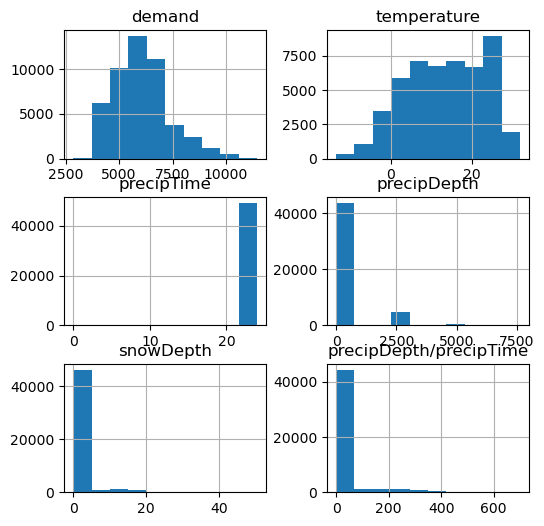

In [23]:
df.select_dtypes(include='number').hist(figsize=(6,6));

It does make sense that  weather variables that reflect snow or precipitation would show skewed distribution or values concentrated in a particular section or a bin. 

##### Create some date-time features

In [24]:
def create_datetime_features(df, *dt_attr, datetime_col='datetime'):
    '''This function creates date-time features from  datetime column in the DataFrame
        
        Args:
            df (pd.DataFrame): Pandas Dataframe with datetime Column
            dt_attr (args): args to take that can be used by datetime accessor
            datetime (str): Datetime Column Name  
        
        Returns:
            None: Adds New Columns that contain values created using datetime accessor 
    '''
    df[datetime_col] = pd.to_datetime(df[datetime_col])
    for a in dt_attr:
        if a == 'week':
            df[a] = df[datetime_col].dt.isocalendar().week
            df[a] = df[a].astype(int)
        else:
            df[a] = getattr(df[datetime_col].dt, a)

In [25]:
df['date'] = df.datetime.dt.date
df['time'] = df.datetime.dt.time

In [26]:
datetime_features = ['year', 'month', 'day', 'hour', 'day_of_week', 'day_of_year', 'weekday', 'week']

In [27]:
create_datetime_features(df, *datetime_features,  datetime_col='datetime')
df['weekend'] = df.weekday.apply(lambda x: 1 if x in [5,6] else 0)

We will use a module called workalendar to get the list of Holidays in NYC

In [28]:
from workalendar.usa.new_york import NewYork
cal = NewYork()
df['Holidays'] = df.datetime.apply(lambda x: 1 if cal.is_holiday(x) else 0)

In [29]:
datetime_features += ['weekend', 'Holidays']

In [30]:
from datetime import timedelta, time

In [31]:
df.sort_values('datetime', inplace=True)
df.set_index('datetime', inplace=True)

### Do holidays impact\affect the demand?

We will begin by creating a simple visualization that displays the demand near a particluar holiday.
It does this by plotting a window of demand with vertical lines marking the occurance of a holiday.

In [32]:
holiday_dates = [i for i in df[df.Holidays==1].date.unique()]
holiday_date_vicinity = [(dt-timedelta(days=14), dt+timedelta(days=15)) for dt in holiday_dates[3:]]
holiday_window = iter(holiday_date_vicinity)

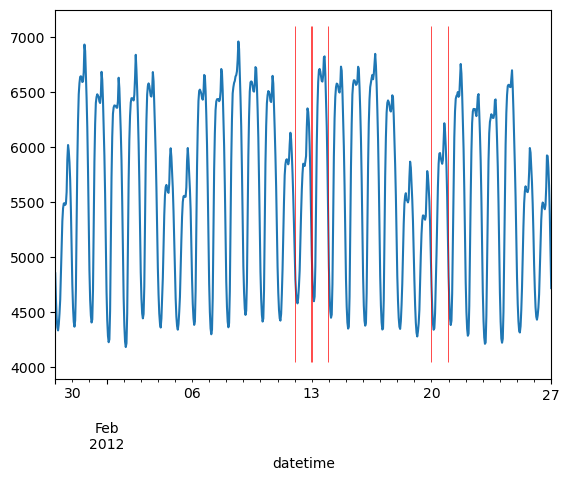

In [33]:
#Run this Cell again to plot the next window when a holiday occurs and see the demand pattern around that event
window = next(holiday_window)

data_slice = df.loc[window[0]:window[1]]
ax = data_slice.demand.plot()
time_slicer = ((data_slice.time==time(0,0))|(data_slice.time==time(23,0)))
holiday_slice = data_slice.loc[(data_slice.Holidays==1)&time_slicer].index
ymin, ymax = ax.get_ylim()
ax.vlines(x=holiday_slice, ymin=ymin, ymax=ymax-1, color='r', lw=0.5)

Approach 1.1: We will start by calculating a measure known as Cramer's V between a categorical variable that indicates days of high/normal/medium daily precent change in demand and occurance of holidays. Cramer's V measures how strongly two categorical fields are associated.

In [34]:
from scipy.stats import chi2_contingency

In [35]:
def calculate_carmersV(series1, series2):
    '''This function helps us calculate Cramer's V stat for two variables series1 & series2'''
    contingency_table = pd.crosstab(series1, series2)
    chi2_stat, p_value, dof, expected = chi2_contingency(np.array(contingency_table), correction=False)
    print(f"chi2 : {chi2_stat}")
    print(f"p-value: {p_value}")
    print(f"Degrees of Freedom: {dof}")
    print("Expected Frequencies:\n",expected)
    n_obs = np.sum(np.array(contingency_table))
    min_dim = min(contingency_table.shape)-1
    cramersV_demand_pct = np.sqrt((chi2_stat/n_obs) / min_dim)
    return cramersV_demand_pct

You may refer to [chi2 table](https://people.richland.edu/james/lecture/m170/tbl-chi.html) to check the significance of the tests based on the printed output

In [36]:
# We calculate percent Change in Demand for a daily frequency 
demand_pct_change = df.demand.pct_change(freq='D').dropna()*100
demand_pct_change = pd.DataFrame(demand_pct_change).join(df.Holidays)
# then group the demand by date to obtain average percentage change for each day 
demand_pct_change = demand_pct_change.groupby(demand_pct_change.index.date).mean()
# create a new column that categorized this average percentage change based on quantiles 
demand_pct_change['demand_level'] = pd.qcut(demand_pct_change.demand, 
                                            [0, .01, .99, 1.],  
                                            labels=['low', 'normal', 'high' ]
                                            )

In [37]:
cramersV_demand_pct = calculate_carmersV(demand_pct_change['demand_level'], demand_pct_change['Holidays'])

chi2 : 0.8647667807241657
p-value: 0.6489605237741045
Degrees of Freedom: 2
Expected Frequencies:
 [[2.02613581e+01 7.38641915e-01]
 [1.93447728e+03 7.05227162e+01]
 [2.02613581e+01 7.38641915e-01]]


In [38]:
cramersV_demand_pct

0.020553726714123387

Approach 1.2: We will calculate Cramer's V between a variable that indicates days of high/normal/medium demand and occurance of holidays.

In [39]:
# get average daily demand
demand_data = df[['demand', 'Holidays']].groupby(df.index.date).mean()
# create a new column that categorized average daily demand based on quantiles 
cramersV_demand = calculate_carmersV(pd.qcut(demand_data.demand, [0, .01,  .99, 1.], 
                                             labels=['low', 'normal', 'high']
                                             ), 
                                     demand_data['Holidays']
                                    )

chi2 : 1.584908060628242
p-value: 0.45273241186639446
Degrees of Freedom: 2
Expected Frequencies:
 [[2.02514648e+01 7.48535156e-01]
 [1.93449707e+03 7.15029297e+01]
 [2.02514648e+01 7.48535156e-01]]


In [40]:
cramersV_demand

0.027818714725497903

Approach 2: We will caclulate the point-biserialr statistic

The point biserialr is a good statistic to get the measure of association between a categorical variable and a continuous varaible. In the following cells we will check the association between:
- Holidays and demand
- Holidays and percent change in demand

In [41]:
from scipy.stats import pointbiserialr

In [42]:
pb_demand_pct = pointbiserialr(demand_pct_change['Holidays'], demand_pct_change['demand'])
pb_demand_pct

SignificanceResult(statistic=0.01612751891963881, pvalue=0.46583547248694174)

Looking at the result above we can say that the results are statistically significant given the p-value that there's a week positive relation between Holidays and Percent Change in Demand.

In [43]:
pb_demand = pointbiserialr(demand_data['Holidays'], demand_data['demand'])
pb_demand

SignificanceResult(statistic=-0.07685120550290996, pvalue=0.0004997059626216608)

Looking at the result above we can say that the results are statistically significant given the p-value that there's a negative relation between Holidays and Demand.

In [44]:
# Summar of Results
holidays_stats = pd.DataFrame({'Value': [pb_demand.statistic, pb_demand_pct.statistic, cramersV_demand, cramersV_demand_pct], 
                               'Stat': ["Point-Biserialr", "Point-Biserialr", "Cramer's V", "Cramer's V"]
                              }, 
                              index = ['Demand', 'Demand_pct', 'Demand_level', 'Demand_pct_level']
                              )
holidays_stats

,Value,Stat
Demand,-0.076851,Point-Biserialr
Demand_pct,0.016128,Point-Biserialr
Demand_level,0.027819,Cramer's V
Demand_pct_level,0.020554,Cramer's V


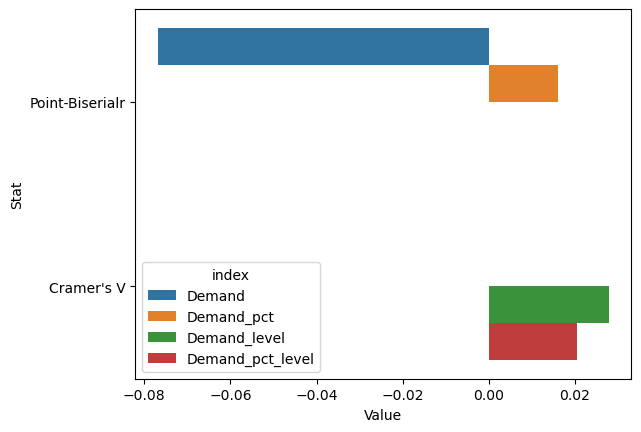

In [45]:
sns.barplot(holidays_stats.reset_index(), x='Value', y='Stat', hue='index', orient='h');

We can conclude that:
- Cramer's V:
    - there's no strong association between Holidays and level of demand 
    - there's no strong association between the level of percent change in demand
- point-biserialr:
    - a statistically significant weak association exists between demand values and holidays 
    - the association between percent change in demand and holidays is weak & is not statistically significant

Approach 3: We can calculate change points in our time series and then calculate Cramer's V  between these changepoints and occurance of Holidays. The Change points are calculated using the [PELT](https://arxiv.org/pdf/1101.1438.pdf) (Pruned Exact Linear Time) algorithm

In [46]:
from pychangepoints import algo_changepoints

In [47]:
#Changepoints for daily average data 
list_cpts, nb_cpts = algo_changepoints.pelt(demand_data[['demand']], 5, 14, 'mbic_mean')
idx_cpt = demand_data.iloc[[pt-1 for pt in list_cpts], :].index
demand_data['ch_pt'] = demand_data.index.isin(idx_cpt)
demand_data['ch_pt'] = demand_data['ch_pt'].apply(lambda x: 1 if x else 0)

In [48]:
calculate_carmersV(demand_data['ch_pt'], demand_data['Holidays'])

chi2 : 5.360971059185225
p-value: 0.02059230430411027
Degrees of Freedom: 1
Expected Frequencies:
 [[1856.38427734   68.61572266]
 [ 118.61572266    4.38427734]]


0.05116308874562584

In [49]:
# Changepoints for daily average percent change data
list_cpts, nb_cpts = algo_changepoints.pelt(demand_pct_change[['demand']], 5, 14, 'mbic_mean')
idx_cpt = demand_pct_change.iloc[[pt-1 for pt in list_cpts], :].index
demand_pct_change['ch_pt'] = demand_pct_change.index.isin(idx_cpt)
demand_pct_change['ch_pt'] = demand_pct_change['ch_pt'].apply(lambda x: 1 if x else 0)

In [50]:
calculate_carmersV(demand_pct_change['ch_pt'], demand_pct_change['Holidays'])

chi2 : 0.4262583392110357
p-value: 0.5138306588827122
Degrees of Freedom: 1
Expected Frequencies:
 [[1.92386419e+03 7.01358085e+01]
 [5.11358085e+01 1.86419150e+00]]


0.014430371867962965

In both cases there's weak association

### What are the Seasonal (daily, hourly, monthly, etc) patterns in the data?

#### EDA

Let's have a look at the Distribultion of Demand w.r.t. to different date & time variables.

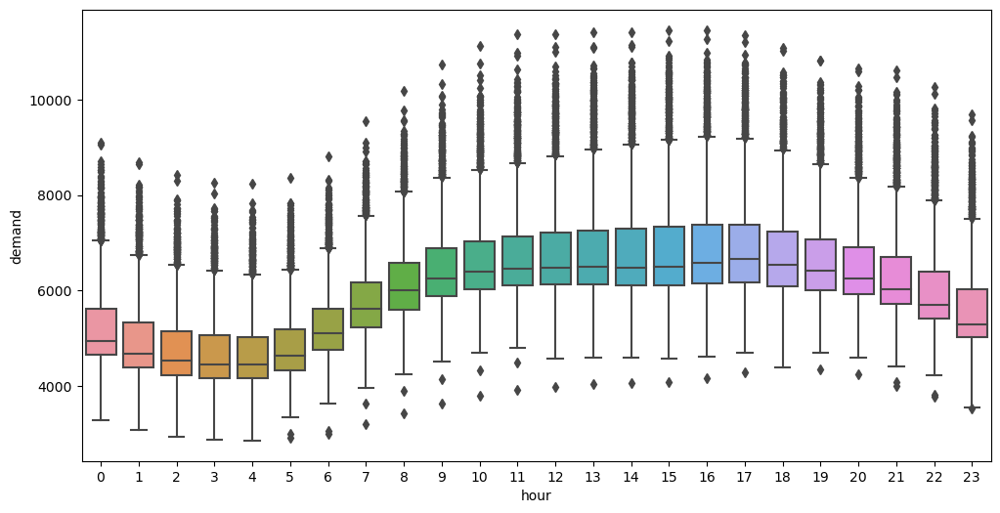

In [69]:
plt.figure(figsize=(12,6))
sns.boxplot(data=df, x='hour', y='demand')
plt.show()

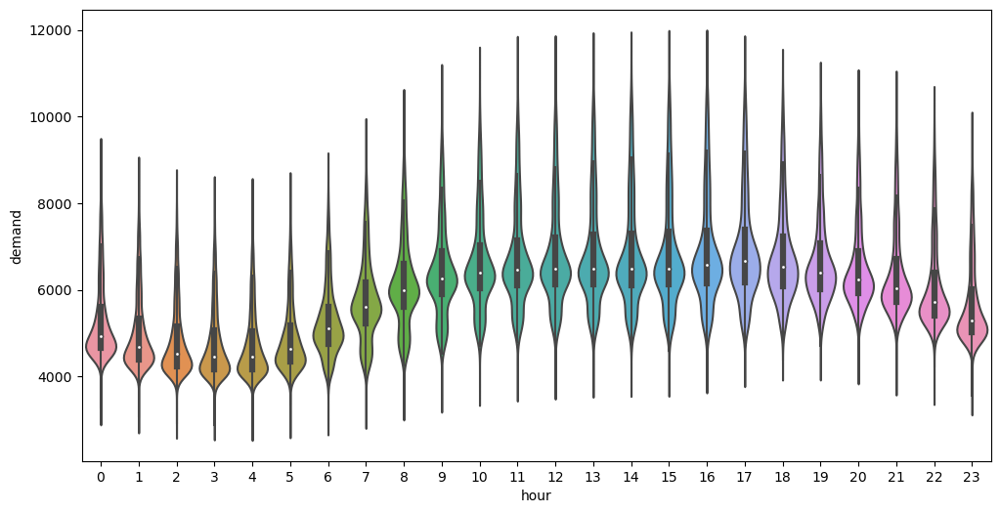

In [70]:
plt.figure(figsize=(12,6))
sns.violinplot(data=df, x='hour', y='demand', scale='width', inner='box')
plt.show()

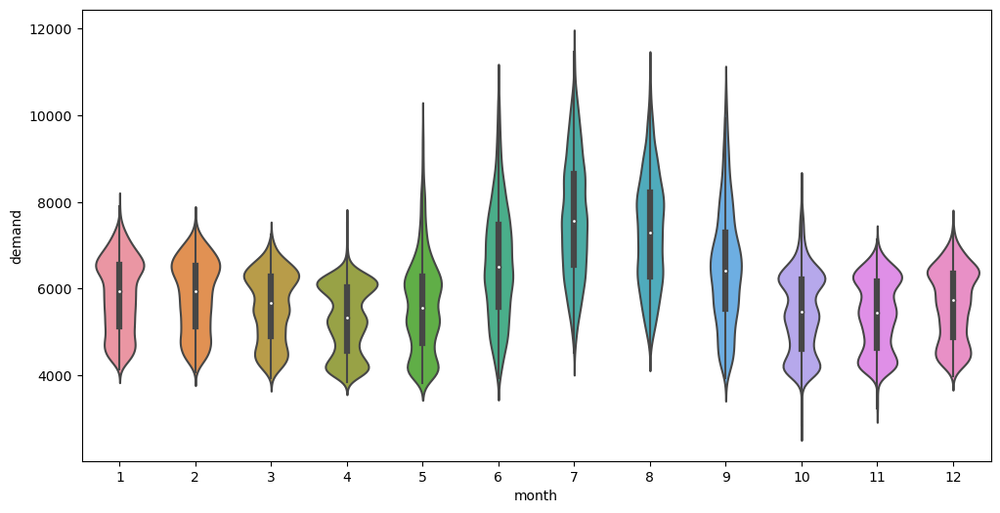

In [56]:
plt.figure(figsize=(12,6))
sns.violinplot(data=df, x='month', y='demand', inner='box')
plt.show()

#### [sns multiple time series plot](https://seaborn.pydata.org/examples/timeseries_facets.html)

In [71]:
def create_sns_plot(df, x, y, col, hue, units):
    """
    Return the grid plot timeseries grouped by col, hue and unit.

    Parameter
    ---------
    df : pd.DataFrame
        Dataframe used to plot the grid.
    x : str
        column Name of X axis in each of the plots part of the grid.
    y : str
        column Name of Y axis in each of the plots part of the grid.
    col : str
        column Name of Variable used to separate the plots.
    hue : str
        column Name of Variable used to group the relplot.
    units : str
        column Name of Variable used to group the lineplot.

    Returns
    -------
    seaborn.FacetGrid
        FacetGrid for multiple time series.
    """

    sns.set_theme(style="dark")
    g = sns.relplot(
        data=df,
        x=x, y=y, col=col, hue=hue,
        kind="line", palette="crest", linewidth=4, 
        # zorder=5,
        col_wrap=3, 
        height=2, 
        aspect=1.5, 
        legend=False,
    )

    for fig, ax in g.axes_dict.items():

        ax.text(.8, .85, fig, transform=ax.transAxes, fontweight="bold")

        sns.lineplot(
            data=df, x=x, y=y, units=units,
            estimator=None, color=".7", linewidth=1, ax=ax,
        )

    # Reduce the frequency of the x axis ticks
    ax.set_xticks(ax.get_xticks()[::2])

    # Tweak the supporting aspects of the plot
    g.set_titles("")
    g.set_axis_labels("", "Demand")
    g.tight_layout()

#### Plot of Demand versus months segregated by Each Hour

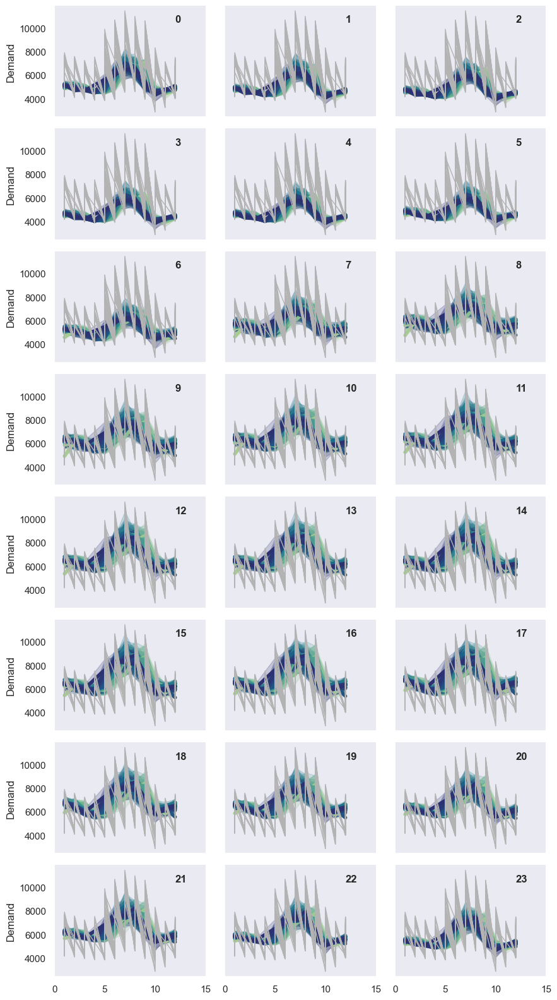

In [53]:
create_sns_plot(df, 'month', 'demand', 'hour', 'day', 'day')

A few more grid plots for demand sliced and grouped by different date-time variables
The following cell creates a dictionary of values to map each plot generated by a particluar grouping to a coordinate in the subplot

In [72]:
color = sns.color_palette("crest", n_colors=48)

In [55]:
nrow, ncol = 3, 4
count = 1
ar_coord = {}
for r in range(nrow):
    for c in range(ncol):
        ar_coord[count] = (r,c)
        count+=1

##### Plot of Demand for each day as it varies over different hours in a given Month

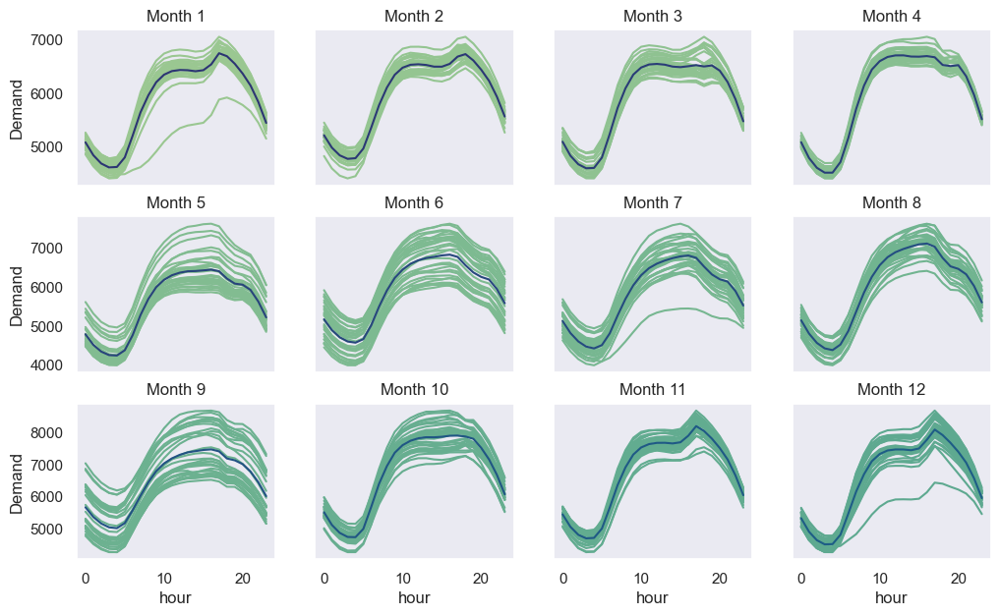

In [56]:
fig, axes = plt.subplots(nrow, ncol, figsize=(12, 7))
for i in range(1, 13):
    ax_coord = ar_coord[i]
    pivot_df = pd.pivot_table(df[df.month==i], index='hour', columns='day', values='demand', margins=True, margins_name='mean')
    pivot_df.drop('mean', inplace=True)
    pivot_df.drop('mean', axis=1).plot(title=f'Month {i}', legend=False, ax=axes[ax_coord[0],ax_coord[1]], sharex=True, sharey=True, color=color[i])
    pivot_df[['mean']].plot(legend=False, ax=axes[ax_coord[0],ax_coord[1]], sharex=True, sharey=True, color=color[-i])
plt.setp(axes[:, 0], ylabel='Demand')
plt.show()

##### Plot of Demand for each hour as it varies over different days in a given Month

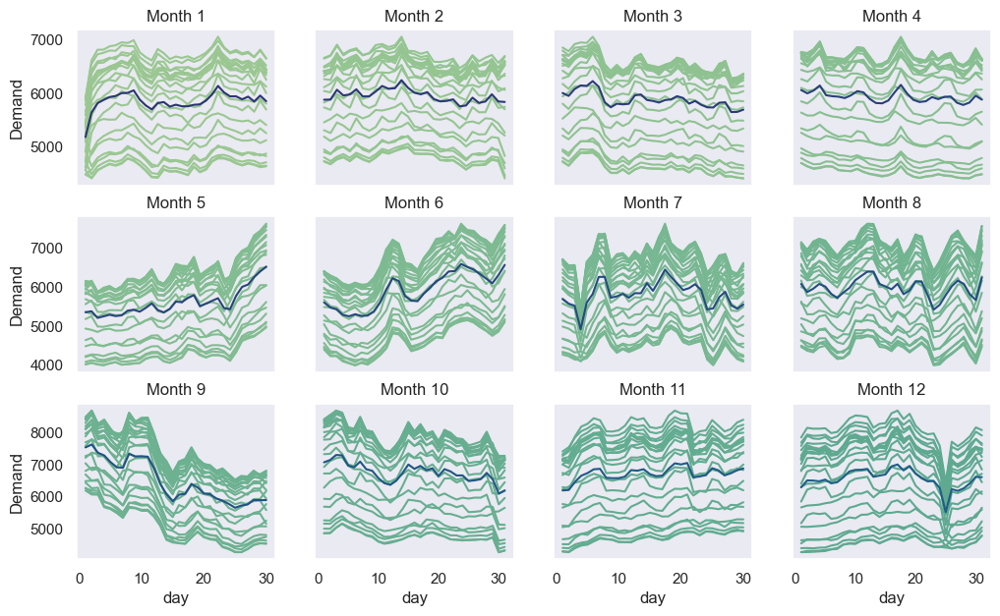

In [57]:
fig, axes = plt.subplots(nrow, ncol, figsize=(12, 7))
for i in range(1, 13):
    ax_coord = ar_coord[i]
    pivot_df = pd.pivot_table(df[df.month==i], index='day', columns='hour', values='demand', margins=True, margins_name='mean')
    pivot_df.drop('mean', inplace=True)
    pivot_df.drop('mean', axis=1).plot(title=f'Month {i}' ,legend=False, ax=axes[ax_coord[0],ax_coord[1]], color=color[i])
    pivot_df[['mean']].plot(legend=False, ax=axes[ax_coord[0],ax_coord[1]], sharex=True, sharey=True, color=color[-i])
plt.setp(axes[:, 0], ylabel='Demand')
plt.show()

Looking at the visualization above we can definitely see the hourly pattern that is evident throughout the data. We can see hours of peak demand occur in the evening. We can also see that some months have more of a variation in the daily demand as compared to others.
We can also see that some days in a particular month have higher or lower average hourly demand.

####  Statistical Analysis
To analyse trend & seasonality: We will use statsmodels seasonal decomposition function to extract trend and seasonality of our time series. However its important to note that the time series has to be stationary for this analysis.

##### Daily Seasonailty

From our earlier look at the series and visualization of the various averages we know that the trend is is very small if at all and that an additive decompostion would be better suited as oppsed to a multiplicative one that assumes a trend that changes over time (curved trend).

In [58]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [59]:
decomp_daily = seasonal_decompose(df['demand'], model='additive', period=24)

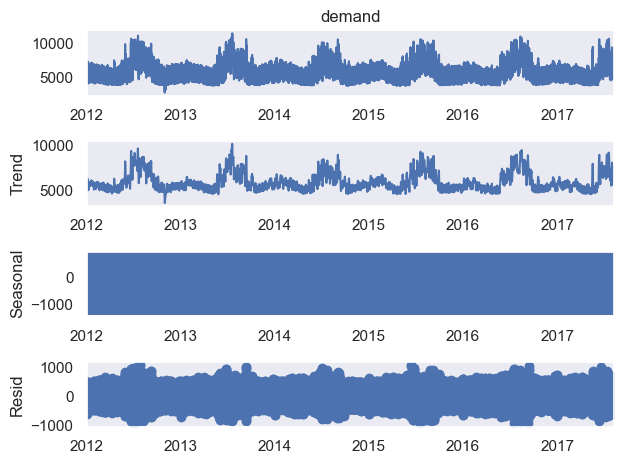

In [60]:
decomp_daily.plot();

In [61]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [62]:
def show_plotly_ts(Series1, Series2):
    '''Creates a plotly scatter plot of two pandas datetime indexed series'''
    ts = pd.concat([Series1,Series2], axis=1, join='inner')
    fig = make_subplots(specs=[[{"secondary_y": True}]])

    # Add traces
    fig.add_trace(
        go.Scatter(x=ts.index, y=ts.iloc[:, 0], name=Series1._name),
        secondary_y=False,
    )

    fig.add_trace(
        go.Scatter(x=ts.index, y=ts.iloc[:, 1], name=Series2._name),
        secondary_y=True,
    )
    fig.show()

In [63]:
show_plotly_ts(decomp_daily.seasonal, decomp_daily.resid)

In [64]:
class DisplayWindow:
    '''
    Helps visualise a time window of seasonal and residual components by iterating over a date range. 
    '''
    def __init__(self, freq, *args, **kwargs):
        if kwargs:
            ts_list1 = [self.get_ts(v) for v in kwargs.values()]
        if args:
            ts_list2 = [self.get_ts(arg) for arg in args]
        self.ts = pd.concat(ts_list1+ts_list2, axis=1, join='inner')
     
        self.get_date_range(freq=freq)
        self.right_dt_bound = self.date_range[1:]
        self.left_dt_bound = self.date_range[:-1]
        self.strafe = zip(self.left_dt_bound, self.right_dt_bound)

    def get_ts(self, series):
        ts = pd.DataFrame(series)
        ts = ts.dropna()
        return ts
    
    def get_date_range(self, freq):
        st = self.ts.index.min()
        en = self.ts.index.max()
        self.date_range = pd.date_range(start=st, end=en, freq=freq)

    def plot(self, *args):
        '''
        Plots the Components. 
        Args:
            self: Takes args initialized by the Class.
        Returns:
            plots the next window of seasonal and residual components.
        '''
        next_window = next(self.strafe)
        self.ts.loc[next_window[0]:next_window[1], [arg for arg in args]].plot(subplots=True)
        plt.show()

In [65]:
dp_win = DisplayWindow(str(24*7*2)+'H', 
                       decomp_daily.trend, 
                       seasonal = decomp_daily.seasonal, 
                       resid = decomp_daily.resid
                       )

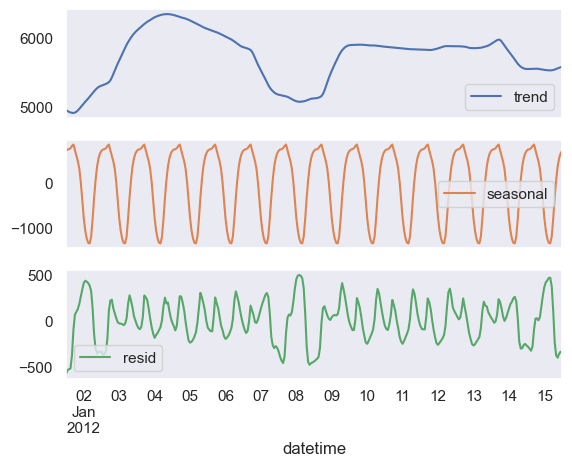

In [66]:
dp_win.plot('trend', 'seasonal', 'resid')

We can clearly see that some of the weekly seasonality seems to have leaked 

In [67]:
df_daily_diff = df['demand'] - decomp_daily.seasonal

##### Weekly Seasonality

In [68]:
decomp_weekly = seasonal_decompose(df_daily_diff, model='additive', period=24*7)

In [69]:
dp_win = DisplayWindow(str(24*7*5)+'H', 
                       decomp_weekly.trend, 
                       seasonal = decomp_weekly.seasonal, 
                       resid = decomp_weekly.resid
                       )

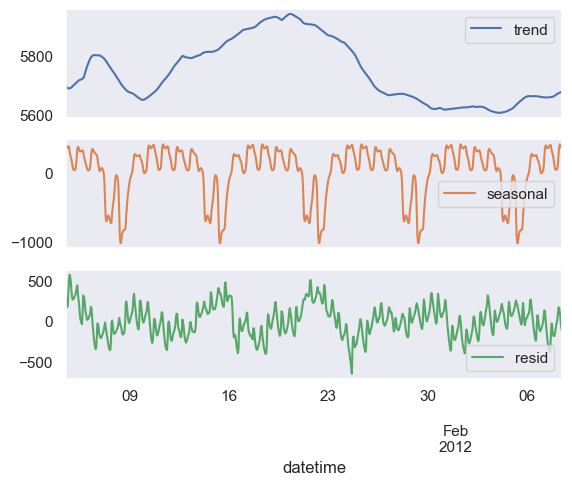

In [70]:
dp_win.plot('trend', 'seasonal', 'resid')

In [71]:
df_weekly_diff = df['demand'] - decomp_weekly.seasonal

##### Yearly Seasonality

In [72]:
decomp_yearly = seasonal_decompose(df_weekly_diff, model='additive', period=int(24*365.5))

In [73]:
dp_win = DisplayWindow(str(24*7*5)+'H', 
                       decomp_yearly.trend, 
                       seasonal = decomp_yearly.seasonal, 
                       resid = decomp_yearly.resid
                       )

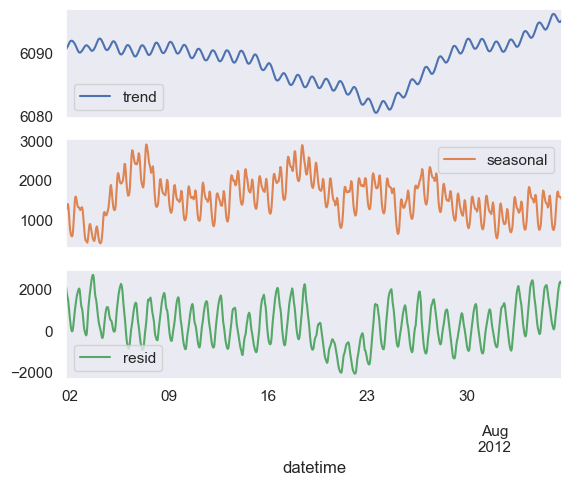

In [74]:
dp_win.plot("trend", 'seasonal', 'resid')

##### We first need to check if the series is stationary before we inspect the ACF & PACF plots to understand the kind of process the time series is; this will help us analyse the auto-regressive and moving average components.

In [75]:
from statsmodels.tsa.stattools import adfuller

In [76]:
def get_adf(ts):
    '''Calculates and Prints augmented dickey-fuller statistic for a time series ts'''
    result = adfuller(ts)
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]:.20f}')
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

In [77]:
get_adf(df['demand'])

ADF Statistic: -10.880378058072859
p-value: 0.00000000000000000013
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


**The time series is stationary** as the p-value is less than 0.05 & ADF statistic value is also less than value at significance level of 1% (**99% confidence**).

##### **Next We take a look at the ACF (Autocorrelation Function) and PACF (Partial Autocorrelation Function) plots**

In [78]:
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf

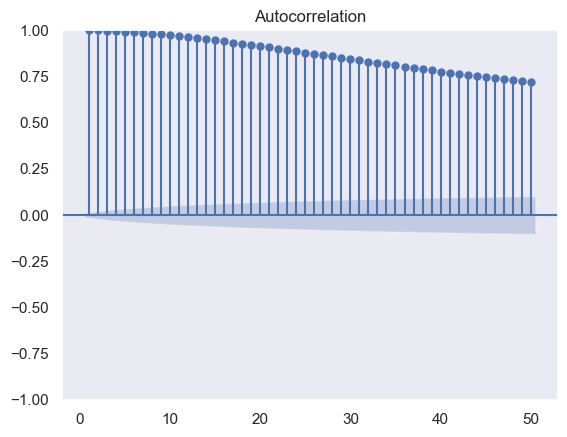

In [79]:
plot_acf(decomp_daily.trend.dropna(), lags=50, zero=False, alpha=0.01);

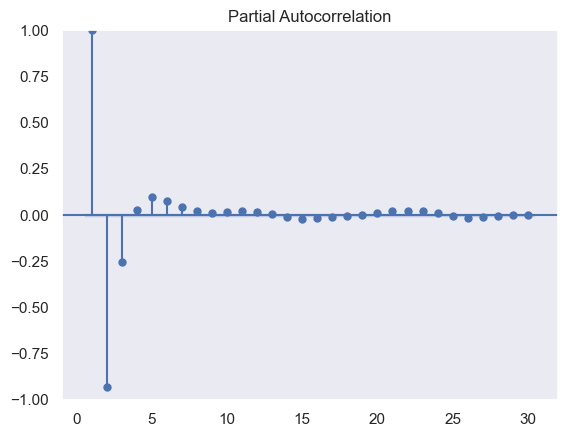

In [80]:
plot_pacf(decomp_daily.trend.dropna(), lags=30, method='ywm', zero=False, alpha=0.01);

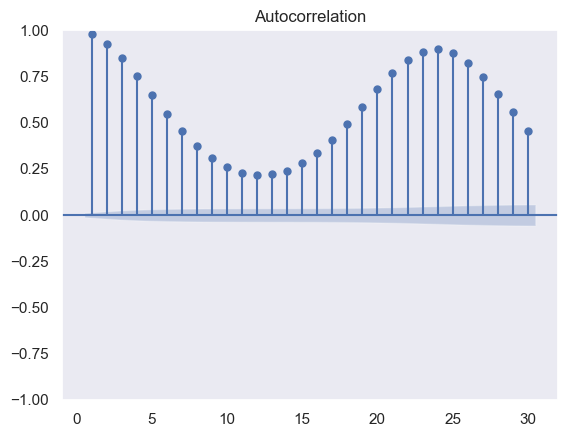

In [81]:
plot_acf(df.demand, lags=30, zero=False, alpha=0.01);

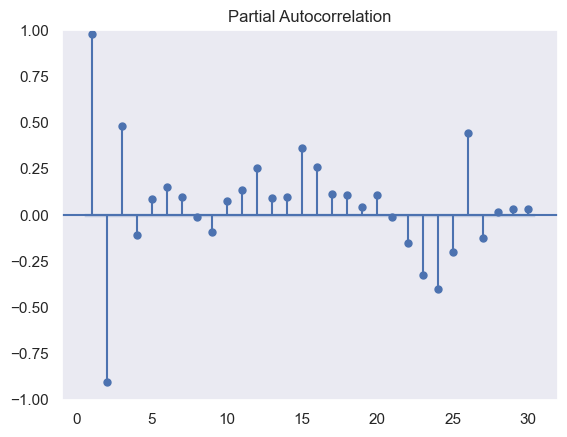

In [82]:
plot_pacf(df.demand, lags=30, zero=False, method='ywm', alpha=0.01);

Looking at the ACF plot of the trend we can see that its infintely continuing whereas the PACF shows a significant value for the lag 1. Similarly, the ACF plot of the demand as is shows a sinusoidal pattern a mark of heavy seasonality, while the PACF plot shows a significant lag at lag 1.
We can treat this as an AR(1) process

In [83]:
# let's check if the seasonal component is stationary
get_adf(decomp_daily.seasonal)

ADF Statistic: -1727437388679.6602
p-value: 0.00000000000000000000
Critical Values:
	1%: -3.430
	5%: -2.862
	10%: -2.567


**The time series is stationary** as the p-value is less than 0.05

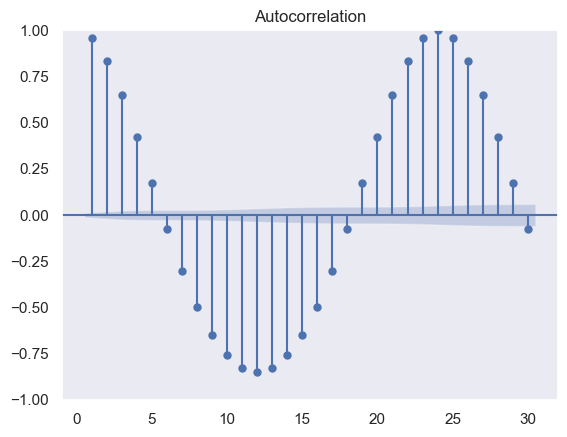

In [84]:
plot_acf(decomp_daily.seasonal, lags=30, zero=False, alpha=0.01);

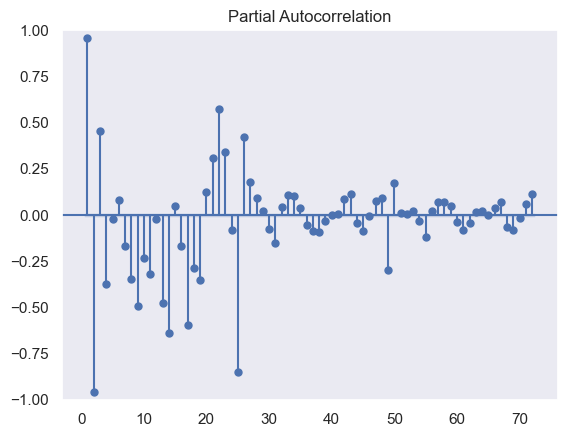

In [85]:
plot_pacf(decomp_daily.seasonal, lags=72, zero=False, method='ywm', alpha=0.01);

Looking at the ACF plot of the daily seasonal component we can see a sinusoidal pattern a mark of heavy seasonality, which adheres to our assumption of there being multiple seasoanl components. The PACF plot shows a significant lag at lag 1.
We can treat this as an AR(1) process.
*Remember that you can figure out the autoregressive parameter (p) by looking at the PACF plot when the ACF plot shows infinite series or sinusoidal pattern. This kind of pattern in the ACF plot implies seasonality or periodicity of some kind.*

### How viable are SARIMA & traditional ML algorithms to forecast electricity demand?

We will look at the MAPE as the performance metric to gauge accuracy & run time of backtests to check efficiency.
To understand the second question we will look at how much of an increase we get in the accuracy as well as check feature importance of weather features in our best model

In [73]:
from sklearn.metrics import mean_absolute_percentage_error

def get_mape(y_true, y_pred):
    '''Takes true values and predicted values to return mean absoulte error percentage 
        in terms of percent values
    '''
    return mean_absolute_percentage_error(y_true, y_pred)*100

In [74]:
val_split_point, test_split_point = df.index[-24*365], df.index[-24*7]

#### Univariate Forecasting

In [75]:
from skforecast.model_selection_statsmodels import grid_search_sarimax

In [89]:
param_grid = {'order': [
                        # (2,0,0),
                        (1,0,0),
                        ],
             'seasonal_order': [
                                (1,0,0,24),
                                (2,0,0,24),
                                ],
             'trend': ['c', 't']
             }

results_grid = grid_search_sarimax(
                   y = df.loc[:test_split_point, 'demand'],
                   param_grid = param_grid,
                   initial_train_size = len(df.loc[:val_split_point]),
                   fixed_train_size = True,
                   steps = 24,
                   metric = get_mape,
                   refit = False,
                   verbose = True,
                   fit_kwargs = {'maxiter': 200, 'disp': 0}
               )

results_grid

root       INFO  Number of models compared: 4
  0%|                                                               | 0/4 [00:00<?, ?it/s]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


 25%|█████████████▌                                        | 1/4 [02:50<08:32, 170.73s/it]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


 50%|███████████████████████████                           | 2/4 [05:05<04:58, 149.31s/it]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


 75%|████████████████████████████████████████▌             | 3/4 [15:40<06:11, 371.48s/it]c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.

c:\ProgramData\Miniconda3\envs\Azure\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning:

No frequency information was provided, so inferred frequency H will be used.



Number of observations used for training: 40393
Number of observations used for backtesting: 8592
    Number of folds: 358
    Number of steps per fold: 24


100%|██████████████████████████████████████████████████████| 4/4 [19:53<00:00, 298.37s/it]


,params,metric,order,seasonal_order,trend
0,"{'order': (1, 0, 0), 'seasonal_order': (1, 0, ...",5.621392,"(1, 0, 0)","(1, 0, 0, 24)",c
1,"{'order': (1, 0, 0), 'seasonal_order': (1, 0, ...",5.847004,"(1, 0, 0)","(1, 0, 0, 24)",t
3,"{'order': (1, 0, 0), 'seasonal_order': (2, 0, ...",5.849411,"(1, 0, 0)","(2, 0, 0, 24)",t
2,"{'order': (1, 0, 0), 'seasonal_order': (2, 0, ...",8.230500,"(1, 0, 0)","(2, 0, 0, 24)",c


In [90]:
from skforecast.model_selection_statsmodels import backtesting_sarimax

In [187]:
metric, predictions_backtest = backtesting_sarimax(
                                    y = df.loc[:, 'demand'],
                                    order = (1, 0, 0),
                                    trend='c',
                                    seasonal_order = (1, 0, 0, 24),
                                    initial_train_size = len(df.loc[:test_split_point]),
                                    fixed_train_size = True,
                                    steps = 24,
                                    metric = get_mape,
                                    refit = False,
                                    verbose = True,
                                    fit_kwargs = {'maxiter': 200, 'disp': 0}
                               )

Number of observations used for training: 48936
Number of observations used for backtesting: 167
    Number of folds: 7
    Number of steps per fold: 24
    Last fold only includes 23 observations.


In [188]:
metric

7.2440814434585805

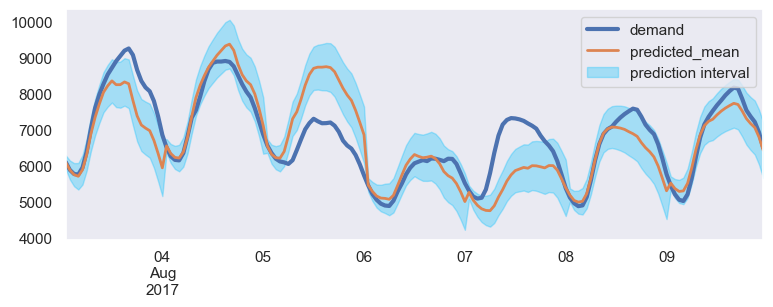

In [198]:
pred_backtest_sarima = predictions_backtest.join(data_test['demand'])
fig, ax=plt.subplots(figsize=(9, 3))
pred_backtest_sarima['demand'].plot(ax=ax, linewidth=3)
pred_backtest_sarima['predicted_mean'].plot(ax=ax, linewidth=2)
ax.fill_between(
    pred_backtest_sarima.index,
    pred_backtest_sarima['lower demand'],
    pred_backtest_sarima['upper demand'],
    color = 'deepskyblue',
    alpha = 0.3,
    label='prediction interval'
)
ax.legend();

#### Multivariate EDA

In [93]:
show_plotly_ts(df['demand'], df['temperature'])

In [94]:
show_plotly_ts(df['demand'], df['precipDepth'])

We can immediately see that the precipiation values in the later period in our date seems to either follow a different distribution altogether or has some very erroneous values. This might have happened due to issues with the enrichment methods provide by azureml-opendataset module.
Just to stay on the safe side we will not use these variables in this notebook. However getting access to good precipitation data for subsequent rounds of analysis would defiitely be the way forward and would help with accuracy.

#### Feature Engineering

Check using the autocorr function and confirm what the pacf plot above shows us

In [76]:
demand_autocorr = pd.DataFrame(zip(range(1,50), [df['demand'].autocorr(i) for i in range(1,50)]),
                               columns=['lag', 'autocorr']
                               )

In [77]:
demand_autocorr[(demand_autocorr.autocorr>=0.5)&(demand_autocorr.lag>=24)].sort_values('autocorr', ascending=False)

,lag,autocorr
23,24,0.898888
24,25,0.877939
25,26,0.825111
47,48,0.786545
46,47,0.772364
48,49,0.767390
26,27,0.748124
45,46,0.728105
44,45,0.660706
27,28,0.655519


In [78]:
imp_demand_lags = demand_autocorr.loc[(demand_autocorr.autocorr>=0.5)&(demand_autocorr.lag>=24), 'lag'].tolist()

In [79]:
def create_lag_features(df, col, lag):
    '''Creates column in df by lagging col by lag specified'''
    df[col+'_lag'+str(lag)] = df[col].shift(lag)

def get_lagged_features(df):
    '''Returns all Columns with lag suffix'''
    return [col for col in df.columns if '_lag' in col]

In [80]:
# Creates Lag of Demand the target Variable
for lag in imp_demand_lags:
    create_lag_features(df, 'demand', lag)

# List of weather variables considered
weather_features = ['temperature', 'snowDepth']

# Creates lagged weather features
for col in weather_features:
    for lag in imp_demand_lags:
        create_lag_features(df, col, lag)

In [81]:
# Drops NaNs introduced in the dataframe by creation of lagged features
df.dropna(inplace=True)

In [82]:
# Gets all lagged features
predictors = get_lagged_features(df)
demand_lags = [p for p in predictors if 'demand' in p]

##### Correlation Heatmap

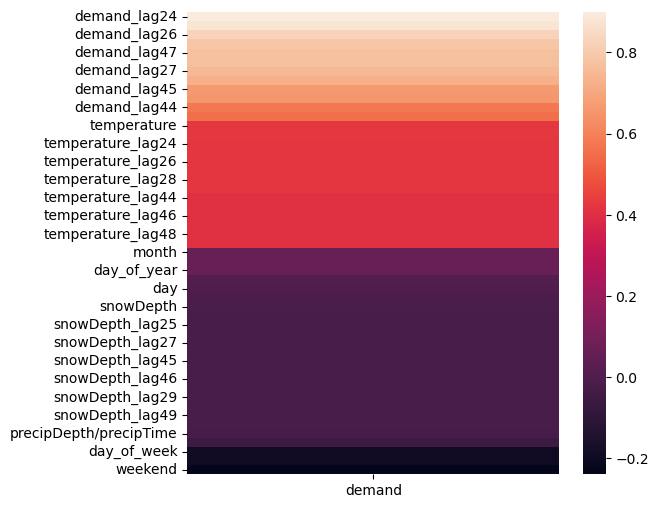

In [93]:
plt.figure(figsize=(6,6))
df_corr = df.corr(numeric_only=True).iloc[1:, :1]
df_corr.sort_values('demand', ascending=False, inplace=True)
sns.heatmap(df_corr);

##### MI Score

In [103]:
from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, y, discrete_features):
    '''
    Calculates Mutual Information Score for a given Target variable and List of Features
    
    Args:
        X: DataFrame of Features
        y: Array or Dataframe consisting of Target Variables
    Returns:
        MI Score
    '''
    mi_scores = mutual_info_regression(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values()
    return mi_scores

In [104]:
# https://www.kaggle.com/code/ryanholbrook/mutual-information

discrete_features = df.drop(['demand', 'new_datetime', 'timeStamp', 'date', 'time']+weather_features, axis=1).dtypes == int
mi_score = make_mi_scores(df.drop(['demand', 'new_datetime', 'timeStamp', 'date', 'time']+weather_features, axis=1), df['demand'], discrete_features)

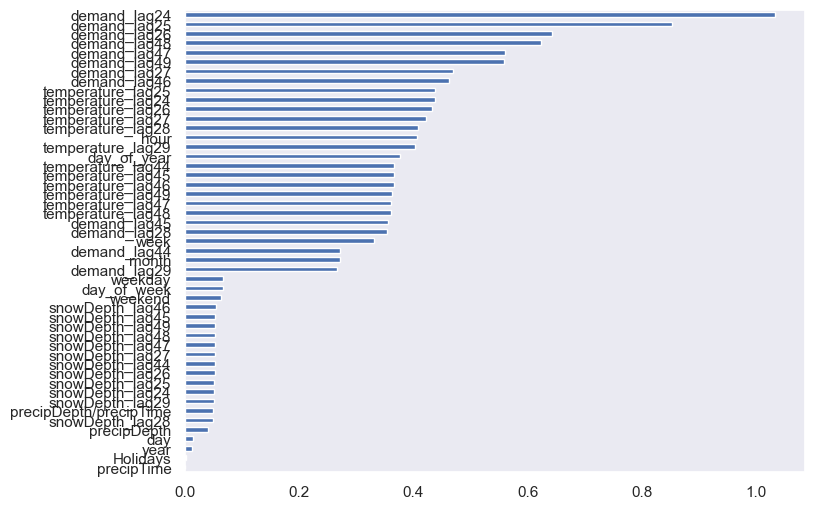

In [105]:
plt.figure(figsize=(8,6))
mi_score.plot.barh();

##### Creation of Trignometric and One Hot Encoded datetime features

In [106]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import OneHotEncoder

In [107]:
def sin_transformer(period):
    return FunctionTransformer(lambda x: np.sin(x / period * 2 * np.pi))

def cos_transformer(period):
    return FunctionTransformer(lambda x: np.cos(x / period * 2 * np.pi))

In [108]:
#Create Trignometric Features

df["hour_sin"] = sin_transformer(24).fit_transform(df["hour"])
df["hour_cos"] = cos_transformer(24).fit_transform(df["hour"])

df["month_sin"] = sin_transformer(12).fit_transform(df["month"])
df["month_cos"] = cos_transformer(12).fit_transform(df["month"])

df["week_sin"] = sin_transformer(53).fit_transform(df["week"])
df["week_cos"] = cos_transformer(53).fit_transform(df["week"])

df["doy_sin"] = sin_transformer(53).fit_transform(df["day_of_year"])
df["doy_cos"] = cos_transformer(53).fit_transform(df["day_of_year"])

In [109]:
trig_dt_cols = [col for col in df.columns if (('cos' in col)|('sin' in col))]

In [110]:
ohe = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
ohe_dt_transformer = ColumnTransformer(transformers=[('ohe_datetime', ohe, 
                                                      ['hour', 'month', 'day', 'day_of_week']
                                                      )
                                                     ]
                                       )
ohe_dt_transformer.set_output(transform='pandas')

df = df.join(ohe_dt_transformer.fit_transform(df))

In [111]:
ohe_cols = list(ohe_dt_transformer.get_feature_names_out())

In [112]:
# Lets get rid of any irrelevant or unusable features for the task of direct multi-step forecasting

data = df.drop(['new_datetime', 'timeStamp', 'date', 'time']+weather_features, axis=1)

#### Multivariate Forecasting 

In [113]:
from sklearn.preprocessing import StandardScaler

In [114]:
from skforecast.model_selection import grid_search_forecaster
from skforecast.model_selection import backtesting_forecaster
from skforecast.ForecasterAutoregDirect import ForecasterAutoregDirect
from skforecast.ForecasterAutoreg import ForecasterAutoreg

In [115]:
data_train = data.loc[:val_split_point, :]
data_val   = data.loc[val_split_point:test_split_point, :]
data_test  = data.loc[test_split_point:, :]

In [116]:
exog_cols = datetime_features + ohe_cols + trig_dt_cols + predictors

In [117]:
data.index.freq = 'H'
data.index.freq

<Hour>

In [130]:
def run_grid_search(reg, param_grid, exog_data=None, scaler=None, 
                    steps=24, lags_grid=imp_demand_lags, 
                    end_validation=test_split_point, end_train=val_split_point,
                    forecaster = 'direct',
                    **kwargs
                    ):
    '''
    Runs Grid Search for sklearn API compatible estimators for a given forecasting timeframe
    
    Args:
        reg: sklearn Compatible Estimator
        param_grid: params that get passed to reg
        exog_data: exogenous data taken by skforecast's grid_search_forecaster
        scaler: sklearn transformer accepted by skforecast's ForecasterAutoregDirect
        steps: Number of steps ahead the forecast is made by ForecasterAutoregDirect at each fold
        lags_grid: additional lags accepted by skforecast's grid_search_forecaster
        end_validation: index where validation dataset ends
        end_train: : index where training dataset ends
        **kwargs: other kwargs accepted by skforecast's grid_search_forecaster

    Returns:
        DataFrame of backtesting grid search results
    '''
    if forecaster=='direct':
        forecaster = ForecasterAutoregDirect(
                    regressor     = reg,
                    transformer_y = scaler,
                    steps         = steps,
                    lags          = list(range(steps, steps+6))
                )
    elif forecaster=='auto':
        forecaster = ForecasterAutoreg(
                    regressor     = reg,
                    transformer_y = scaler,
                    lags          = list(range(steps, steps+6))
                )
        
    lags_grid = [lags_grid, list(range(steps, steps+6))]
    
    grid_search_args = {'refit': False,
                        'fixed_train_size' : False,
                        'return_best' : True,
                        'verbose' : False
                        }

    if kwargs:
        grid_search_args.update(kwargs)
    print(kwargs)

    if isinstance(exog_data, pd.DataFrame):
        x_data = exog_data.loc[:end_validation, :]

    results_grid = grid_search_forecaster(
                    forecaster         = forecaster,
                    y                  = data.loc[:end_validation, 'demand'],
                    exog               = x_data,
                    param_grid         = param_grid,
                    lags_grid          = lags_grid,
                    steps              = steps,
                    metric             = get_mape,
                    initial_train_size = len(data.loc[:end_train]),
                    **grid_search_args
                )
    display(results_grid)
    return forecaster

##### MI Score (with new features) 

In [231]:
discrete_features = data[exog_cols].dtypes == int
mi_score_new = make_mi_scores(data[exog_cols], data['demand'], discrete_features)
mi_score_new.sort_values(ascending=False, inplace=True)

In [266]:
mi_n = mi_score_new[~(mi_score_new == 0)]
mi_top40 = mi_n.iloc[:40]
mi_middle41 = mi_n.iloc[40:-40]
mi_bottom40 = mi_n.iloc[-40:]

In [267]:
mi_top40.sort_values(inplace=True)
mi_middle41.sort_values(inplace=True)
mi_bottom40.sort_values(inplace=True)

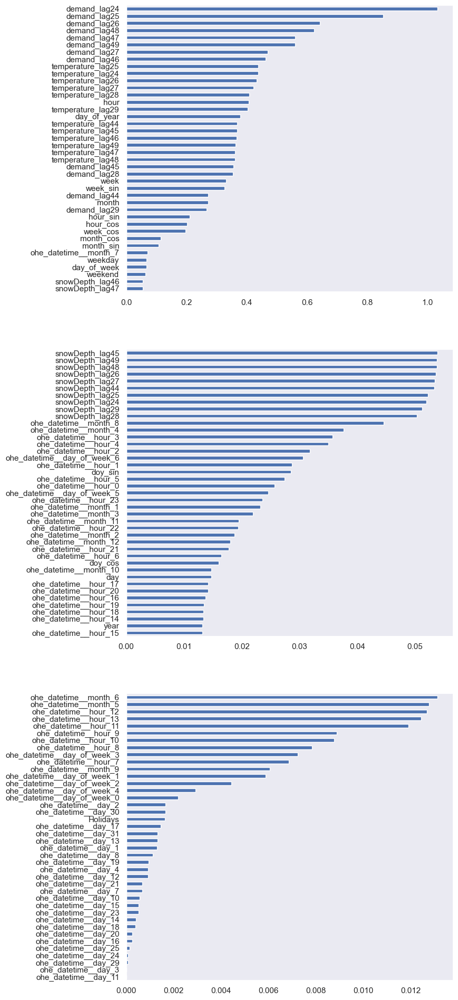

In [277]:
fig, axes = plt.subplots(3, 1, figsize=(8, 24))
mi_top40.plot(kind='barh', ax=axes[0])
mi_middle41.plot(kind='barh', ax=axes[1])
mi_bottom40.plot(kind='barh', ax=axes[2]);

##### Grid Search

In [199]:
ohe1_cols = [col for col in ohe_cols if(('hour' in col)|('month' in col)|('day_of_week' in col))]
ohe2_cols = [col for col in ohe_cols if(('month' in col)|('day_of_week' in col))]
h24_lags = [col for col in predictors if 'lag24' in col]
weather_lags = list(set(predictors)-set(demand_lags))

In [122]:
from sklearn.linear_model import ElasticNet

In [123]:
forecast_elastic = run_grid_search(ElasticNet(random_state=123), 
                                   {'alpha': [1,10],
                                    'l1_ratio': np.arange(0.40,1.00,0.10),
                                    'tol': [0.0001],
                                    'max_iter':[10000]
                                    },
                                    data[datetime_features],
                                    StandardScaler(),
                                    forecaster='auto'
                                   )

{}
Number of models compared: 24.


loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:34<00:00, 77.19s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'alpha': 1, 'l1_ratio': 0.4, 'max_iter': 10000, 'tol': 0.0001}
  Backtesting metric: 11.477988761260933



,lags,params,get_mape,alpha,l1_ratio,max_iter,tol
0,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.4, 'max_iter': 1000...",11.477989,1.0,0.4,10000.0,0.0001
12,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.4, 'max_iter': 1000...",11.646462,1.0,0.4,10000.0,0.0001
1,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.5, 'max_iter': 1000...",12.666198,1.0,0.5,10000.0,0.0001
13,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.5, 'max_iter': 1000...",12.669014,1.0,0.5,10000.0,0.0001
2,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.6, 'max_iter': 1000...",13.711199,1.0,0.6,10000.0,0.0001
14,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.6, 'max_iter': 1000...",13.714569,1.0,0.6,10000.0,0.0001
3,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.7, 'max_iter': 1000...",14.787194,1.0,0.7,10000.0,0.0001
15,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.7, 'max_iter': 1000...",14.790747,1.0,0.7,10000.0,0.0001
4,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.7999999999999999, '...",15.471406,1.0,0.8,10000.0,0.0001
16,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.7999999999999999, '...",15.472882,1.0,0.8,10000.0,0.0001


In [124]:
forecast_elastic = run_grid_search(ElasticNet(random_state=123), 
                                   {'alpha': [1,10],
                                    'l1_ratio': np.arange(0.40,1.00,0.10),
                                    'tol': [0.0001],
                                    'max_iter':[10000]
                                    },
                                    data[trig_dt_cols+ohe1_cols+h24_lags],
                                    StandardScaler(),
                                    forecaster='auto'
                                   )

{}
Number of models compared: 24.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [03:22<00:00, 101.27s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'alpha': 1, 'l1_ratio': 0.4, 'max_iter': 10000, 'tol': 0.0001}
  Backtesting metric: 6.409781060318593



,lags,params,get_mape,alpha,l1_ratio,max_iter,tol
0,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.4, 'max_iter': 1000...",6.409781,1.0,0.4,10000.0,0.0001
12,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.4, 'max_iter': 1000...",6.409973,1.0,0.4,10000.0,0.0001
1,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.5, 'max_iter': 1000...",6.410169,1.0,0.5,10000.0,0.0001
13,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.5, 'max_iter': 1000...",6.410360,1.0,0.5,10000.0,0.0001
2,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.6, 'max_iter': 1000...",6.410557,1.0,0.6,10000.0,0.0001
14,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.6, 'max_iter': 1000...",6.410748,1.0,0.6,10000.0,0.0001
3,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.7, 'max_iter': 1000...",6.410945,1.0,0.7,10000.0,0.0001
15,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.7, 'max_iter': 1000...",6.411137,1.0,0.7,10000.0,0.0001
4,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.7999999999999999, '...",6.411335,1.0,0.8,10000.0,0.0001
16,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.7999999999999999, '...",6.411527,1.0,0.8,10000.0,0.0001


In [125]:
forecast_elastic = run_grid_search(ElasticNet(random_state=123), 
                                   {'alpha': [1,10],
                                    'l1_ratio': np.arange(0.40,1.00,0.10),
                                    'tol': [0.0001],
                                    'max_iter':[10000]
                                    },
                                    data[datetime_features+trig_dt_cols+ohe1_cols+h24_lags], 
                                    StandardScaler(),
                                    forecaster='auto'
                                    )

{}
Number of models compared: 24.


loop lags_grid: 100%|███████████████████████████████████████| 2/2 [02:21<00:00, 70.60s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'alpha': 1, 'l1_ratio': 0.4, 'max_iter': 10000, 'tol': 0.0001}
  Backtesting metric: 6.305627173082932



,lags,params,get_mape,alpha,l1_ratio,max_iter,tol
0,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.4, 'max_iter': 1000...",6.305627,1.0,0.4,10000.0,0.0001
12,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.4, 'max_iter': 1000...",6.306164,1.0,0.4,10000.0,0.0001
1,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.5, 'max_iter': 1000...",6.410169,1.0,0.5,10000.0,0.0001
13,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.5, 'max_iter': 1000...",6.410360,1.0,0.5,10000.0,0.0001
2,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.6, 'max_iter': 1000...",6.410557,1.0,0.6,10000.0,0.0001
14,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.6, 'max_iter': 1000...",6.410748,1.0,0.6,10000.0,0.0001
3,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.7, 'max_iter': 1000...",6.410945,1.0,0.7,10000.0,0.0001
15,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.7, 'max_iter': 1000...",6.411137,1.0,0.7,10000.0,0.0001
4,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'alpha': 1, 'l1_ratio': 0.7999999999999999, '...",6.411335,1.0,0.8,10000.0,0.0001
16,"[24, 25, 26, 27, 28, 29]","{'alpha': 1, 'l1_ratio': 0.7999999999999999, '...",6.411527,1.0,0.8,10000.0,0.0001


In [126]:
from sklearn.ensemble import RandomForestRegressor

In [127]:
forecaster_rf = run_grid_search(RandomForestRegressor(random_state=123, n_jobs=-1), 
                                param_grid = {'n_estimators': [50, 100], 'max_depth': [None]},
                                exog_data=data[datetime_features],
                                forecaster='auto'
                                )

{}
Number of models compared: 4.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [21:35<00:00, 647.85s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'max_depth': None, 'n_estimators': 100}
  Backtesting metric: 4.301009907613202



,lags,params,get_mape,max_depth,n_estimators
1,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'max_depth': None, 'n_estimators': 100}",4.301010,NaN,100.0
0,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'max_depth': None, 'n_estimators': 50}",4.323356,NaN,50.0
3,"[24, 25, 26, 27, 28, 29]","{'max_depth': None, 'n_estimators': 100}",4.329615,NaN,100.0
2,"[24, 25, 26, 27, 28, 29]","{'max_depth': None, 'n_estimators': 50}",4.349060,NaN,50.0


In [128]:
forecaster_rf = run_grid_search(RandomForestRegressor(random_state=123, n_jobs=-1), 
                                param_grid = {'n_estimators': [50, 100], 'max_depth': [None]},
                                exog_data=data[datetime_features+trig_dt_cols+ohe1_cols+weather_lags],
                                forecaster='auto'
                                )

{}
Number of models compared: 4.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [13:30<00:00, 405.11s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29] 
  Parameters: {'max_depth': None, 'n_estimators': 100}
  Backtesting metric: 4.114366179213094



,lags,params,get_mape,max_depth,n_estimators
3,"[24, 25, 26, 27, 28, 29]","{'max_depth': None, 'n_estimators': 100}",4.114366,NaN,100.0
1,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'max_depth': None, 'n_estimators': 100}",4.131819,NaN,100.0
2,"[24, 25, 26, 27, 28, 29]","{'max_depth': None, 'n_estimators': 50}",4.137324,NaN,50.0
0,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'max_depth': None, 'n_estimators': 50}",4.144776,NaN,50.0


In [171]:
forecaster_rf_direct = run_grid_search(RandomForestRegressor(random_state=123, n_jobs=-1), 
                                       param_grid = {'n_estimators': [50, 100], 'max_depth': [None]},
                                       exog_data=data[datetime_features+trig_dt_cols+ohe1_cols+weather_lags],
                                       forecaster='direct'
                                       )

{}
Number of models compared: 4.


loop lags_grid: 100%|███████████████████████████████████| 2/2 [1:20:35<00:00, 2417.94s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29] 
  Parameters: {'max_depth': None, 'n_estimators': 100}
  Backtesting metric: 4.799057540738873



,lags,params,get_mape,max_depth,n_estimators
3,"[24, 25, 26, 27, 28, 29]","{'max_depth': None, 'n_estimators': 100}",4.799058,NaN,100.0
2,"[24, 25, 26, 27, 28, 29]","{'max_depth': None, 'n_estimators': 50}",4.818110,NaN,50.0
0,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'max_depth': None, 'n_estimators': 50}",4.840642,NaN,50.0
1,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'max_depth': None, 'n_estimators': 100}",4.845158,NaN,100.0


In [129]:
from lightgbm import LGBMRegressor

In [131]:
forecast_lgbm = run_grid_search(LGBMRegressor(random_state=123),  
                                param_grid = {'n_estimators': [100],
                                              'max_depth': [3, 5, 10],
                                              'learning_rate': [0.01, 0.1]
                                              },
                                exog_data=data[datetime_features],
                                forecaster='auto'
                                )

{}
Number of models compared: 12.


loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:49<00:00, 54.79s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 10, 'n_estimators': 100}
  Backtesting metric: 4.098820895179996



,lags,params,get_mape,learning_rate,max_depth,n_estimators
5,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",4.098821,0.10,10.0,100.0
11,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",4.125418,0.10,10.0,100.0
4,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.144817,0.10,5.0,100.0
10,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.154924,0.10,5.0,100.0
3,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",4.368544,0.10,3.0,100.0
9,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",4.379879,0.10,3.0,100.0
8,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.01, 'max_depth': 10, 'n_es...",7.990299,0.01,10.0,100.0
2,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.01, 'max_depth': 10, 'n_es...",7.993879,0.01,10.0,100.0
7,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.01, 'max_depth': 5, 'n_est...",8.071137,0.01,5.0,100.0
1,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.01, 'max_depth': 5, 'n_est...",8.075065,0.01,5.0,100.0


In [137]:
forecast_lgbm = run_grid_search(LGBMRegressor(random_state=123),  
                                param_grid = {'n_estimators': [100, 500],
                                              'max_depth': [5, 10],
                                              'learning_rate': [0.1]},
                                exog_data=data[datetime_features+trig_dt_cols+ohe1_cols+weather_lags],
                                forecaster='auto'
                                )

{}
Number of models compared: 8.


loop lags_grid: 100%|███████████████████████████████████████| 2/2 [01:06<00:00, 33.29s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 3.8999203817085584



,lags,params,get_mape,learning_rate,max_depth,n_estimators
1,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",3.899920,0.1,5.0,500.0
3,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",3.911497,0.1,10.0,500.0
5,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",3.922530,0.1,5.0,500.0
6,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",3.937482,0.1,10.0,100.0
0,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",3.945651,0.1,5.0,100.0
7,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",3.953877,0.1,10.0,500.0
2,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",3.965426,0.1,10.0,100.0
4,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.005916,0.1,5.0,100.0


We can also try the direct multi-step autoregressive function that models each step separately. 

In [161]:
forecast_lgbm_direct = run_grid_search(LGBMRegressor(random_state=123),  
                                 param_grid = {'n_estimators': [100, 500],
                                              'max_depth': [5, 10],
                                              'learning_rate': [0.1]},
                                 exog_data=data[datetime_features+trig_dt_cols+ohe1_cols+weather_lags],
                                 forecaster='direct',
                                )

{}
Number of models compared: 8.


loop lags_grid: 100%|██████████████████████████████████████| 2/2 [07:27<00:00, 223.98s/it]


`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [24 25 26 27 28 29 44 45 46 47 48 49] 
  Parameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500}
  Backtesting metric: 4.208813153808884



,lags,params,get_mape,learning_rate,max_depth,n_estimators
1,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.208813,0.1,5.0,500.0
4,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.244370,0.1,5.0,100.0
0,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.248513,0.1,5.0,100.0
3,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",4.272881,0.1,10.0,500.0
5,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 5, 'n_esti...",4.273009,0.1,5.0,500.0
7,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",4.307838,0.1,10.0,500.0
2,"[24, 25, 26, 27, 28, 29, 44, 45, 46, 47, 48, 49]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",4.309673,0.1,10.0,100.0
6,"[24, 25, 26, 27, 28, 29]","{'learning_rate': 0.1, 'max_depth': 10, 'n_est...",4.322188,0.1,10.0,100.0


### How important are NYC Weather Variables as predictors to forecast electricity demand?

We can have a look at the feature importances of these models to see which features rank higher. In the feature importance plots below you will find the feature importances per step for the autoregressive direct multi-step models; these models have different models for each step.  

In [139]:
cm = sns.color_palette("Spectral", as_cmap=True)

In [283]:
def plot_feature_importance(forecaster, top=10, **plot_kwargs):
    '''Creates bar plot for feature importance of fitted forecaster'''
    feat_imps = []
    for i in range(1,25):
        feat_imp = forecaster.get_feature_importance(i)
        feat_imp.sort_values('importance', ascending=False, inplace=True)
        feat_imp['step'] = i
        feat_imps.append(feat_imp.iloc[:top])
    f_feat_imps = pd.concat(feat_imps)
    f_imps_pivot = f_feat_imps.pivot(index='step', columns='feature', values='importance')
    f_imps_pivot.plot(kind='bar', stacked=True, figsize=(12,5), **plot_kwargs)
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

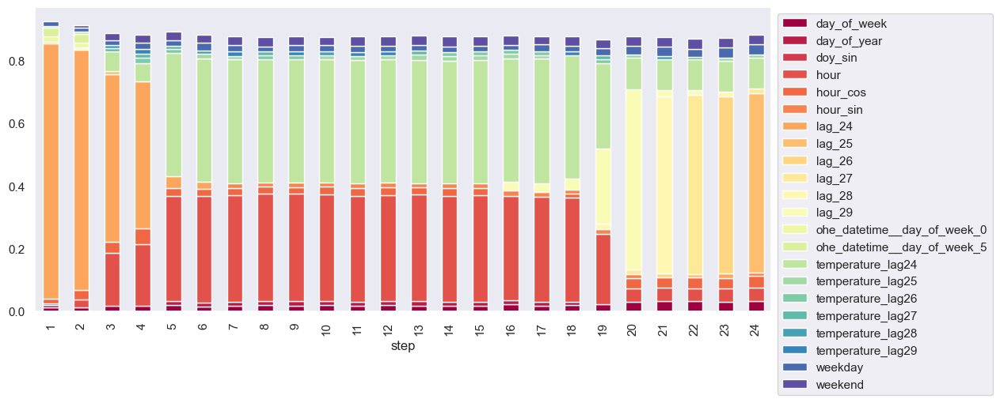

In [284]:
plot_feature_importance(forecaster_rf_direct, top=10, colormap=cm)

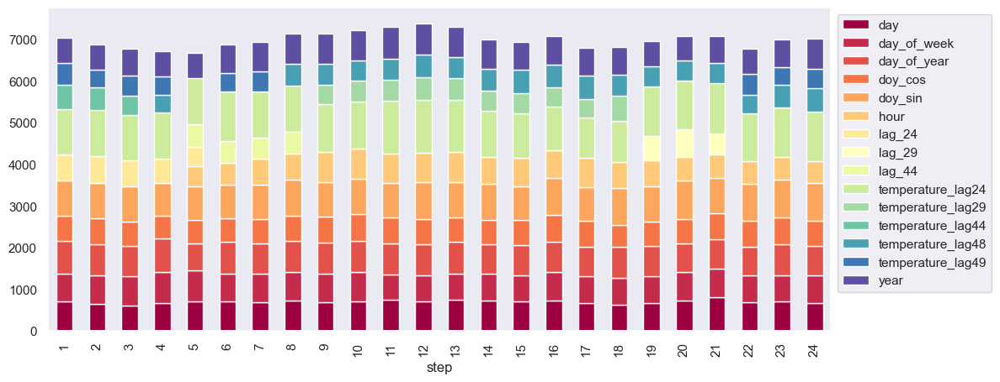

In [285]:
plot_feature_importance(forecast_lgbm_direct, top=10, colormap=cm)

Both the random forest algorithm and lightGBM algorithm gives significant importance to temperature for most of the steps and almost at par with lags of target. Adding other features that use expanding window and\or other transformations of the demand lags as exogenous variables might prove to be useful and further improve accuracy.

### Conclusion

In [173]:
forecaster_lgbm = ForecasterAutoreg(regressor = LGBMRegressor(random_state=123,
                                                               **{'learning_rate': 0.1, 
                                                                  'max_depth': 5,
                                                                  'n_estimators': 500
                                                                  }
                                                                ),
                                     lags= imp_demand_lags
                                    )

In [174]:
metric1, predictions1 = backtesting_forecaster(forecaster_lgbm,
                                             y=data.loc[:, 'demand'],
                                             steps=24, 
                                             metric=get_mape, 
                                             initial_train_size=len(data.loc[:test_split_point, :]), 
                                             fixed_train_size=True, 
                                             exog=data[datetime_features+trig_dt_cols+ohe1_cols+weather_lags], 
                                             refit=False, 
                                             verbose=True
                                            )

Information of backtesting process
----------------------------------
Number of observations used for initial training: 48936
Number of observations used for backtesting: 167
    Number of folds: 7
    Number of steps per fold: 24
    Last fold only includes 23 observations.

Data partition in fold: 0
    Training:   2012-01-03 01:00:00 -- 2017-08-03 00:00:00  (n=48936)
    Validation: 2017-08-03 01:00:00 -- 2017-08-04 00:00:00  (n=24)
Data partition in fold: 1
    Training:   2012-01-03 01:00:00 -- 2017-08-03 00:00:00  (n=48936)
    Validation: 2017-08-04 01:00:00 -- 2017-08-05 00:00:00  (n=24)
Data partition in fold: 2
    Training:   2012-01-03 01:00:00 -- 2017-08-03 00:00:00  (n=48936)
    Validation: 2017-08-05 01:00:00 -- 2017-08-06 00:00:00  (n=24)
Data partition in fold: 3
    Training:   2012-01-03 01:00:00 -- 2017-08-03 00:00:00  (n=48936)
    Validation: 2017-08-06 01:00:00 -- 2017-08-07 00:00:00  (n=24)
Data partition in fold: 4
    Training:   2012-01-03 01:00:00 -- 2017-0

In [175]:
metric1

4.679510939034972

In [176]:
forecaster_lgbm_direct = ForecasterAutoregDirect(regressor = LGBMRegressor(random_state=123,
                                                                         **{'learning_rate': 0.1, 
                                                                            'max_depth': 5, 
                                                                            'n_estimators': 500}
                                                                         ),
                                          steps         = 24,
                                          lags          = imp_demand_lags
                                         )

In [177]:
metric2, predictions2 = backtesting_forecaster(forecaster_lgbm_direct,
                                             y=data.loc[:, 'demand'],
                                             steps=24, 
                                             metric=get_mape, 
                                             initial_train_size=len(data.loc[:test_split_point, :]), 
                                             fixed_train_size=True, 
                                             exog=data[datetime_features+trig_dt_cols+ohe1_cols+weather_lags], 
                                             refit=False, 
                                             verbose=True
                                            )

Information of backtesting process
----------------------------------
Number of observations used for initial training: 48936
Number of observations used for backtesting: 167
    Number of folds: 7
    Number of steps per fold: 24
    Last fold only includes 23 observations.

Data partition in fold: 0
    Training:   2012-01-03 01:00:00 -- 2017-08-03 00:00:00  (n=48936)
    Validation: 2017-08-03 01:00:00 -- 2017-08-04 00:00:00  (n=24)
Data partition in fold: 1
    Training:   2012-01-03 01:00:00 -- 2017-08-03 00:00:00  (n=48936)
    Validation: 2017-08-04 01:00:00 -- 2017-08-05 00:00:00  (n=24)
Data partition in fold: 2
    Training:   2012-01-03 01:00:00 -- 2017-08-03 00:00:00  (n=48936)
    Validation: 2017-08-05 01:00:00 -- 2017-08-06 00:00:00  (n=24)
Data partition in fold: 3
    Training:   2012-01-03 01:00:00 -- 2017-08-03 00:00:00  (n=48936)
    Validation: 2017-08-06 01:00:00 -- 2017-08-07 00:00:00  (n=24)
Data partition in fold: 4
    Training:   2012-01-03 01:00:00 -- 2017-0

In [178]:
metric2

4.622114746726157

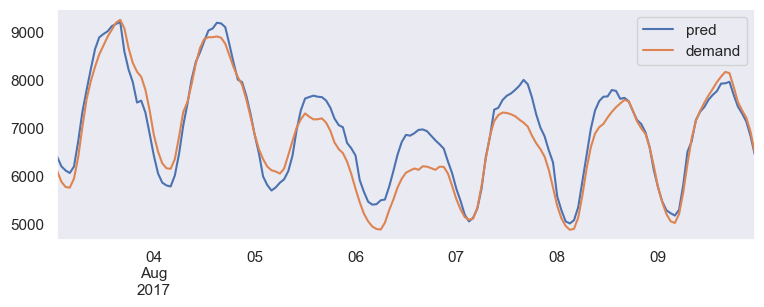

In [286]:
predictions1.join(data_test.demand).plot(figsize=(9,3));

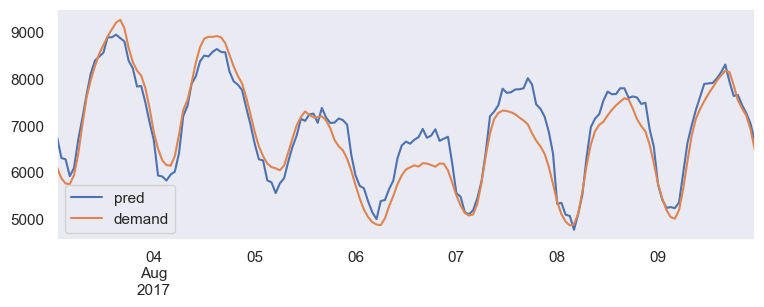

In [287]:
predictions2.join(data_test.demand).plot(figsize=(9,3));